# <center> Python Programming in Energy Science </center>

## <center> Lecture 3, 23 April 2025 </center>

<img src="files/pycourse2.png" width="300" />

-------------------------------

### **Contents**
1. Recap of pandas functions e.g., datetime capabilities and data handling
2. Applying pandas to real data

#### What you should have learned after today

- Reading timeseries data with multiple variables
- Filtering and filling with empty values
- Questioning the data
- Interactive plotting to better understand the data
- Resampling time series data

--------------------------------

Lecturer: 

Lukas Vollmer
lukas.vollmer@iwes.fraunhofer.de

In [1]:
# needed python modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go

## (1) Recap of pandas functions e.g., datetime capabilities and data handling

The **pandas** libary is built on top of NumPy. Its core data structure is called **DataFrame**, which essentially consists of multi-dimensional data of heterogeneous data types and associated column and row names.

Basically you can imagine a DataFrame object like a table with columns of possibly different data types. Pandas comes with a number of practical functionality on top of that, for example, it is easy to select one or more columns as indices and address specific data ranges of the latter.

### (1.1) The multi-dimensional _DataFrame_

The pandas _DataFrame_ can be understood as a sequence of aligned _Series_ objects, with a common flexible index and column names. It is pandas central data structure, and extremely powerfull for any kind of tablular data.

_DataFrame_ objects have a number of columns with data, and an index. The latter can be thought of as the quantity that defines rows in the table. Pandas then makes it very easy and fast to operate on subsets of columns or rows or both, much faster than any loop could do.

Pandas _DataFrame_ objects can be created
- from a single series object
- from a list of dicts
- from a dict of lists
- from a dict of series objects
- from a two-dimensional NumPy ndarray
- from an index list/ndarray and empty columns

In [4]:
# Example for the construction from a numpy array
a = np.random.randint(0, 101, size=10)
a = pd.DataFrame(a)
print(a)

    0
0  65
1  67
2  23
3  36
4  26
5  40
6  92
7  55
8  32
9   8


In [5]:
# The index of a DataFrame is a seperate object (and can be anything)
print(a.index)

RangeIndex(start=0, stop=10, step=1)


### (1.2) Datetime handling

Pandas comes with an extensive datetime functionality, 
as described in the [documentation](https://pandas.pydata.org/pandas-docs/stable/user_guide/timeseries.html). 

In [6]:
# You can easily create a range of datetime data:
t = pd.date_range(start='2020-01-01', end='2020-01-01 09:00', freq='h')
print(t)

# Or if you just know start date, frequency and number of entries
t = pd.date_range(start='2020-01-01', freq='h', periods=len(a))
print(t)



DatetimeIndex(['2020-01-01 00:00:00', '2020-01-01 01:00:00',
               '2020-01-01 02:00:00', '2020-01-01 03:00:00',
               '2020-01-01 04:00:00', '2020-01-01 05:00:00',
               '2020-01-01 06:00:00', '2020-01-01 07:00:00',
               '2020-01-01 08:00:00', '2020-01-01 09:00:00'],
              dtype='datetime64[ns]', freq='h')
DatetimeIndex(['2020-01-01 00:00:00', '2020-01-01 01:00:00',
               '2020-01-01 02:00:00', '2020-01-01 03:00:00',
               '2020-01-01 04:00:00', '2020-01-01 05:00:00',
               '2020-01-01 06:00:00', '2020-01-01 07:00:00',
               '2020-01-01 08:00:00', '2020-01-01 09:00:00'],
              dtype='datetime64[ns]', freq='h')


In [7]:
# We can make our DataFrame to a timeseries-DataFrame by making the index a datetime index
a.index = t
print(a)

                      0
2020-01-01 00:00:00  65
2020-01-01 01:00:00  67
2020-01-01 02:00:00  23
2020-01-01 03:00:00  36
2020-01-01 04:00:00  26
2020-01-01 05:00:00  40
2020-01-01 06:00:00  92
2020-01-01 07:00:00  55
2020-01-01 08:00:00  32
2020-01-01 09:00:00   8


You see we created a Dataframe with a datetime index. That format is the most fun in Pandas as it provides the most implemented functions.


In [8]:
# if a file has a column with a datatime format Pandas can automatically interprete it in most cases with the parse_dates argument
a.to_csv('test_t.csv')

a = pd.read_csv('test_t.csv',index_col=0, parse_dates=[0])
print(a.index)

DatetimeIndex(['2020-01-01 00:00:00', '2020-01-01 01:00:00',
               '2020-01-01 02:00:00', '2020-01-01 03:00:00',
               '2020-01-01 04:00:00', '2020-01-01 05:00:00',
               '2020-01-01 06:00:00', '2020-01-01 07:00:00',
               '2020-01-01 08:00:00', '2020-01-01 09:00:00'],
              dtype='datetime64[ns]', freq=None)


In [9]:
# We can use the resample function for smart statistical calculations in the time domain

# for example calculate the mean of each day
print(a.resample('D').mean())

# or the max every 6 hours
print(a.resample('6h').mean())

# We can also go to higher frequencies, e.g. add a value at every half hour which is the average of the full hour values before and after
print(a)
print(a.resample('30min').interpolate())


               0
2020-01-01  44.4
                             0
2020-01-01 00:00:00  42.833333
2020-01-01 06:00:00  46.750000
                      0
2020-01-01 00:00:00  65
2020-01-01 01:00:00  67
2020-01-01 02:00:00  23
2020-01-01 03:00:00  36
2020-01-01 04:00:00  26
2020-01-01 05:00:00  40
2020-01-01 06:00:00  92
2020-01-01 07:00:00  55
2020-01-01 08:00:00  32
2020-01-01 09:00:00   8
                        0
2020-01-01 00:00:00  65.0
2020-01-01 00:30:00  66.0
2020-01-01 01:00:00  67.0
2020-01-01 01:30:00  45.0
2020-01-01 02:00:00  23.0
2020-01-01 02:30:00  29.5
2020-01-01 03:00:00  36.0
2020-01-01 03:30:00  31.0
2020-01-01 04:00:00  26.0
2020-01-01 04:30:00  33.0
2020-01-01 05:00:00  40.0
2020-01-01 05:30:00  66.0
2020-01-01 06:00:00  92.0
2020-01-01 06:30:00  73.5
2020-01-01 07:00:00  55.0
2020-01-01 07:30:00  43.5
2020-01-01 08:00:00  32.0
2020-01-01 08:30:00  20.0
2020-01-01 09:00:00   8.0


## (2) Applying pandas to real data

### La Haute Borne Wind Farm Data

The French company Engie started to publish data from a 4 turbine wind farm in 2018. 

It consists of 4 identical MM82 wind turbines from Senvion generating up to 2 MW energy each – the maximum rated power for a single turbine is 2050 kW. 
It provides electricity in Vaudeville-le-Haut commune, Meuse department, from 2009 on.

The website for download is currently not available anymore ...

Fortunately we have some data to play around with

### (2.1) First look at data

In [10]:
# Let's load the data

df = pd.read_csv('la-haute-borne-data-2014-2015.csv')
print(df.index)

RangeIndex(start=0, stop=420480, step=1)


In [11]:
# Let's have a look at all data columns
print(df.columns)

Index(['Wind_turbine_name', 'Date_time', 'Ba_avg', 'P_avg', 'Ws_avg', 'Va_avg',
       'Ot_avg', 'Ya_avg', 'Wa_avg'],
      dtype='object')


In [12]:
# Let's have a first idea about the content

# We can just look at the first entries, e.g.
print(df.head())

# .describe() provides an overview over the statistical properties
print(df.describe())

# .info() provides an info about data types, completeness and size of data
print(df.info())

  Wind_turbine_name                  Date_time  Ba_avg      P_avg  Ws_avg  \
0            R80736  2014-01-01T01:00:00+01:00   -1.00  642.78003    7.12   
1            R80721  2014-01-01T01:00:00+01:00   -1.01  441.06000    6.39   
2            R80790  2014-01-01T01:00:00+01:00   -0.96  658.53003    7.11   
3            R80711  2014-01-01T01:00:00+01:00   -0.93  514.23999    6.87   
4            R80790  2014-01-01T01:10:00+01:00   -0.96  640.23999    7.01   

   Va_avg  Ot_avg     Ya_avg     Wa_avg  
0    0.66    4.69  181.34000  182.00999  
1   -2.48    4.94  179.82001  177.36000  
2    1.07    4.55  172.39000  173.50999  
3    6.95    4.30  172.77000  179.72000  
4   -1.90    4.68  172.39000  170.46001  
              Ba_avg          P_avg         Ws_avg         Va_avg  \
count  417911.000000  417911.000000  417911.000000  417911.000000   
mean       10.041381     353.610076       5.447462       0.113614   
std        23.249670     430.378700       2.487332      23.030714   
min      

#### The columns have the following meaning (as described on the deprecated website)
- Wind_turbine_name: Name of the turbine
- Date_time: Time stamp of the measurement
- Ba_avg: Blade angle, Pitch (deg)
- P_avg: Power (kW)
- Ws_avg: Wind speed (m/s)
- Va_avg: relative yaw alignment (deg)
- Ot_avg: outside temperature (deg C)
- Ya_avg: absolute yaw alignment (deg)
- Wa_avg: wind direction (deg)

In [13]:
# Let's try to extract a variable for a turbine

turbines = df.Wind_turbine_name.unique()
print(f'There are {len(turbines)} unique turbine names in the data')
print(turbines)

# We select all data for one of the turbines

t = turbines[3] # select the fourth turbine
df_t = df[df['Wind_turbine_name']==t]
print(df_t)

There are 4 unique turbine names in the data
['R80736' 'R80721' 'R80790' 'R80711']
       Wind_turbine_name                  Date_time  Ba_avg      P_avg  \
3                 R80711  2014-01-01T01:00:00+01:00   -0.93  514.23999   
6                 R80711  2014-01-01T01:10:00+01:00   -0.93  692.33002   
8                 R80711  2014-01-01T01:20:00+01:00   -0.93  580.12000   
14                R80711  2014-01-01T01:30:00+01:00   -0.93  559.48999   
17                R80711  2014-01-01T01:40:00+01:00   -0.93  349.01001   
...                  ...                        ...     ...        ...   
420462            R80711  2016-01-01T00:10:00+01:00   -0.99  320.62000   
420466            R80711  2016-01-01T00:20:00+01:00   -0.99  394.25000   
420468            R80711  2016-01-01T00:30:00+01:00   -0.99  430.70999   
420475            R80711  2016-01-01T00:40:00+01:00   -0.99  424.03000   
420478            R80711  2016-01-01T00:50:00+01:00   -0.99  376.82999   

        Ws_avg     Va_avg  O

### (2.2) Creating a datetime index and check for completeness

In [14]:
# The Date_time column has a specific notation
print(df_t.Date_time)

3         2014-01-01T01:00:00+01:00
6         2014-01-01T01:10:00+01:00
8         2014-01-01T01:20:00+01:00
14        2014-01-01T01:30:00+01:00
17        2014-01-01T01:40:00+01:00
                    ...            
420462    2016-01-01T00:10:00+01:00
420466    2016-01-01T00:20:00+01:00
420468    2016-01-01T00:30:00+01:00
420475    2016-01-01T00:40:00+01:00
420478    2016-01-01T00:50:00+01:00
Name: Date_time, Length: 105120, dtype: object


In [15]:
# Now we need to get a Datetime index

df_t.loc[:,'Date_time'] = pd.to_datetime(df_t.Date_time,utc=True)
df_t.index = df_t.Date_time
df_t = df_t.sort_index()
print(df_t.index)

DatetimeIndex(['2014-01-01 00:00:00+00:00', '2014-01-01 00:10:00+00:00',
               '2014-01-01 00:20:00+00:00', '2014-01-01 00:30:00+00:00',
               '2014-01-01 00:40:00+00:00', '2014-01-01 00:50:00+00:00',
               '2014-01-01 01:00:00+00:00', '2014-01-01 01:10:00+00:00',
               '2014-01-01 01:20:00+00:00', '2014-01-01 01:30:00+00:00',
               ...
               '2015-12-31 22:20:00+00:00', '2015-12-31 22:30:00+00:00',
               '2015-12-31 22:40:00+00:00', '2015-12-31 22:50:00+00:00',
               '2015-12-31 23:00:00+00:00', '2015-12-31 23:10:00+00:00',
               '2015-12-31 23:20:00+00:00', '2015-12-31 23:30:00+00:00',
               '2015-12-31 23:40:00+00:00', '2015-12-31 23:50:00+00:00'],
              dtype='datetime64[ns, UTC]', name='Date_time', length=105120, freq=None)


c:\Users\nuwaw\miniforge3\envs\wise2024\Lib\site-packages\pandas\core\indexes\base.py:7631: FutureWarning: Dtype inference on a pandas object (Series, Index, ExtensionArray) is deprecated. The Index constructor will keep the original dtype in the future. Call `infer_objects` on the result to get the old behavior.
  return Index(index_like, name=name, copy=copy)


In [21]:
# Let's check if all time steps exist

df_t = df_t['2014-01':'2015-12']
print('Are there any missing time steps?')
print('Difference in time steps compared to two full years:')


Are there any missing time steps?
Difference in time steps compared to two full years:


In [22]:
print(len(df_t) - (2*365*24*6))

0


#### Check for duplicated indexes

In [23]:
# ok, looks great, so there should also be no duplicated data
print(np.sum(df_t.index.duplicated()))

12


#### What happens here?

In [24]:
# Let's check where the duplicates are
df_t[df_t.index.duplicated(keep='first')]

,Wind_turbine_name,Date_time,Ba_avg,P_avg,Ws_avg,Va_avg,Ot_avg,Ya_avg,Wa_avg
Date_time,,,,,,,,,
2014-03-30 01:00:00+00:00,R80711,2014-03-30 01:00:00+00:00,-0.99,172.61000,5.300000,-5.280000,15.020000,113.50,108.210000
2014-03-30 01:10:00+00:00,R80711,2014-03-30 01:10:00+00:00,-0.99,207.42000,5.490000,-5.930000,15.180000,113.50,107.580000
2014-03-30 01:20:00+00:00,R80711,2014-03-30 01:20:00+00:00,-0.99,247.42999,5.520000,-10.860000,15.300000,113.50,102.680000
2014-03-30 01:30:00+00:00,R80711,2014-03-30 01:30:00+00:00,-0.99,259.39999,5.600000,-19.020000,15.260000,113.50,94.480003
2014-03-30 01:40:00+00:00,R80711,2014-03-30 01:40:00+00:00,-0.99,241.95000,5.480000,-19.510000,15.320000,113.50,93.980003
2014-03-30 01:50:00+00:00,R80711,2014-03-30 01:50:00+00:00,-0.99,254.17000,5.480000,-18.799999,15.350000,113.50,94.709999
2015-03-29 01:00:00+00:00,R80711,2015-03-29 01:00:00+00:00,-0.94,1117.37000,9.020001,-2.580000,8.990000,226.55,223.960010
2015-03-29 01:10:00+00:00,R80711,2015-03-29 01:10:00+00:00,-0.96,1028.16000,8.900000,-2.010000,9.000000,226.55,224.530000
2015-03-29 01:20:00+00:00,R80711,2015-03-29 01:20:00+00:00,-0.23,1481.42000,10.590000,-0.170000,9.000000,226.55,226.380000


### (2.3) Creating a consistent time series DataFrame

Data frames can be merged for example to add data to a dataframe or to make the indexing consistent between two data frames

In [25]:
# drop duplicates
df_t = df_t[~df_t.index.duplicated(keep='first')]
print('Difference in time steps compared to two full years:')
print(len(df_t) - (2*365*24*6))

Difference in time steps compared to two full years:
-12


In [26]:
# create full time range and join with data
df_all = pd.DataFrame(index=pd.date_range(start='2014-01-01 00:00:00',end='2015-12-31 23:50:00',freq='10min',tz='utc'))


In [27]:
# merge with the original data frame to create a full time series
df_t = df_t.join(df_all,how='right')
print('Difference in time steps compared to two full years:')
print(len(df_t) - (2*365*24*6))

Difference in time steps compared to two full years:
0


#### Check data for nan values

.isna() and .isnull() can both be used to flag NaN values in a DataFrame 


In [28]:
df_t[df_t.isna().all(axis=1)]
df_t[df_t.isnull().all(axis=1)]

,Wind_turbine_name,Date_time,Ba_avg,P_avg,Ws_avg,Va_avg,Ot_avg,Ya_avg,Wa_avg
2014-10-26 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-10-26 00:10:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-10-26 00:20:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-10-26 00:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-10-26 00:40:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2014-10-26 00:50:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-25 00:00:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-25 00:10:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-25 00:20:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-25 00:30:00+00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### (2.4) Data Visualisation

In [29]:
# ok, finally let's look at some data

p = df_t['P_avg'] # power
ws = df_t['Ws_avg'] # wind speed

<Axes: >

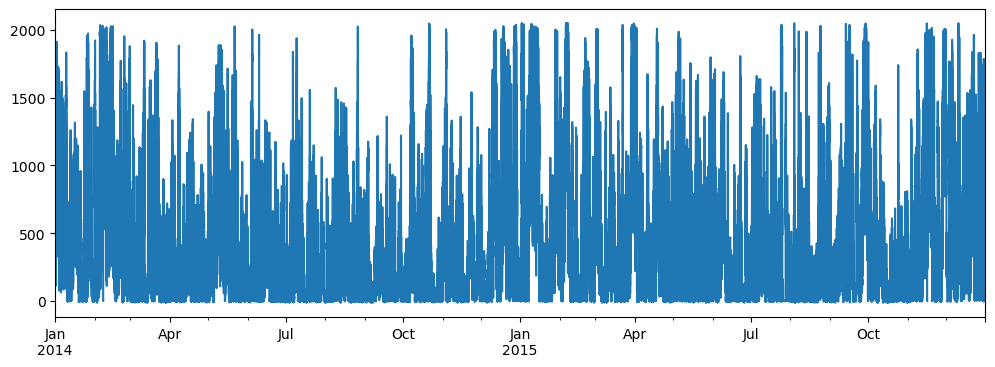

In [30]:
# use of matplotlib
plt.figure(figsize=(12,4))
p.plot()

#### The plotly library offers more interactive plotting possibilities

In [31]:
import plotly.graph_objects as go

# The time series of the data is usually the first thing to look at
fig = go.Figure()
fig.add_trace(go.Scattergl(x=ws.index,y=ws))

In [32]:
# let's look at the power curve, i.e power over wind speed
fig = go.Figure()

# We can use the text input to assign what is shown in the hover information at each data point (here the datetime)

fig.add_trace(go.Scattergl(x=ws,y=p,mode='markers',text=ws.index))

In [ ]:
# let's look at the power curve, i.e power over wind speed
fig = go.Figure()

# We can use the text input to assign what is shown in the hover information at each data point (here temperature)

fig.add_trace(go.Scattergl(x=ws,y=p,mode='markers',text=df_t.Ot_avg))

In [ ]:
# let's look at some other variables
# e.g. 
# Ba_avg : average pitch angle
print(df_t.columns)
var = df_t['Ba_avg']

fig = go.Figure()
fig.add_trace(go.Scattergl(x=p,y=var,mode='markers',text=p.index))

### (2.5) Data reordering and selection

Until now we only worked with a subset of one turbine. 
All operations are of course also possible for the whole data set.

In [ ]:
# Working with the whole dataframe

# convert the index of the whole data frame to 
df.index = pd.to_datetime(df.Date_time,utc=True)

# remove duplicates
df[df.duplicated(subset= ['Wind_turbine_name','Date_time'])]
df = df[~df.duplicated(subset= ['Wind_turbine_name','Date_time'],keep='first')]

In [ ]:
# create a data frame that only contains power and has the turbines as columns
p = df.pivot(columns=['Wind_turbine_name'],values='P_avg')

In [ ]:
print(p)
fig = go.Figure()
for i in range(4):
    fig.add_trace(go.Scatter(x=p.index,y=p.iloc[:,i],mode='lines',name=p.columns[i]))
fig.show()

### (2.6) Using datetime capabilities

In [ ]:
# creating a monthly mean from the selected data
p_monthly = p.resample('MS').mean()
fig = go.Figure()
for i in range(4):
    fig.add_trace(go.Scatter(x=p_monthly.index,y=p_monthly.iloc[:,i],mode='lines',name=p.columns[i]))
fig.show()